## Import packages and app key

In [1]:
import refinitiv.dataplatform as rdp
import refinitiv.dataplatform.legacy as ek


import pandas as pd
import plotly.express as px

rdp.open_desktop_session('DEFAULT_CODE_BOOK_APP_KEY')

#Displays all the columns and rows - useful in the dev process
#pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)

## <u> Gather data </u>

## Search for RICs, get it to a list

#### Example: Search for Brazil global sovereign bonds
            in USD with a duration greater than 1

In [2]:
df = rdp.search(
    view=rdp.SearchViews.FixedIncomeInstruments,
    filter = "IndustrySectorDescription eq 'Sovereign' and \
              IssuerCountryName eq 'Brazil' and \
              OptionAdjustedDuration gt 1 and \
              Currency eq 'USD'",
    select ="RIC, ISIN, MaturityDate, CouponRate ,Currency,IndustrySector, FaceOutstandingUSD, DocumentTitle, IssuerCountryName, OptionAdjustedDuration",
    top=100
    )
df


,ISIN,DocumentTitle,FaceOutstandingUSD,Currency,RIC,MaturityDate,CouponRate,IndustrySector,IssuerCountryName,OptionAdjustedDuration
0,US105756BU30,"Brazil, Federative Republic of (Government), P...",2150000000,USD,105756BU3=,2023-01-05T00:00:00.000Z,2.625,SOVERGRN,Brazil,2.408109
1,US105756AR10,"Brazil, Federative Republic of (Government), P...",1029030000,USD,BR012631375=,2024-04-15T00:00:00.000Z,8.875,SOVERGRN,Brazil,3.251022
2,US105756AZ36,"Brazil, Federative Republic of (Government), P...",85557000,USD,BR017244388=,2024-04-15T00:00:00.000Z,8.875,SOVERGRN,Brazil,3.251022
3,US105756BV13,"Brazil, Federative Republic of (Government), P...",4300000000,USD,105756BV1=,2025-01-07T00:00:00.000Z,4.250,SOVERGRN,Brazil,4.095792
4,US105756BF62,"Brazil, Federative Republic of (Government), P...",688201000,USD,BR021210641=,2025-02-04T00:00:00.000Z,8.750,SOVERGRN,Brazil,3.770753
5,US105756CD06,"Brazil, Federative Republic of (Government), P...",1250000000,USD,105756CD0=,2025-06-06T00:00:00.000Z,2.875,SOVERGRN,Brazil,4.531975
6,US105756BX78,"Brazil, Federative Republic of (Government), P...",2176245000,USD,105756BX7=,2026-04-07T00:00:00.000Z,6.000,SOVERGRN,Brazil,4.862286
7,US105756AE07,"Brazil, Federative Republic of (Government), P...",765023000,USD,105756AE0=,2027-05-15T00:00:00.000Z,10.125,SOVERGRN,Brazil,5.213388
8,US105756BZ27,"Brazil, Federative Republic of (Government), P...",3000000000,USD,105756BZ2=,2028-01-13T00:00:00.000Z,4.625,SOVERGRN,Brazil,6.082924
9,US105756CA66,"Brazil, Federative Republic of (Government), P...",2000000000,USD,105756CA6=,2029-05-30T00:00:00.000Z,4.500,SOVERGRN,Brazil,7.163854


### Convert RICs from search results to 'list' type format
#### get_data wants a list!

In [3]:
rics = df['RIC']
ricList = [''.join(elemnt) for elemnt in rics]  #trick to convert the rics from a series to a list

display(ricList)
display(type(rics))
display(type(ricList))


['105756BU3=',
 'BR012631375=',
 'BR017244388=',
 '105756BV1=',
 'BR021210641=',
 '105756CD0=',
 '105756BX7=',
 '105756AE0=',
 '105756BZ2=',
 '105756CA6=',
 'BR010862957=',
 '105756CC2=',
 'BR018426994=',
 'BR024104117=',
 '105756BR0=',
 '105756BW9=',
 '105756BY5=',
 '105756CB4=']

pandas.core.series.Series

list

### Set the fields

In [4]:
#Bringing in my fields - the Data Item Browser and Code Creator are your friends!
#I used both the DIB and CODECD

fields = ['CF_DATE',
          'TR.CouponRate',
          'TR.ISIN',
          'TR.IssuerRating',
          'TR.FiDescription',
          'TR.FiFirstCouponDate',
          'TR.FIIssuerName',
          'TR.FiMaturityDate',
          'TR.CA.AmtOutstanding',
          'TR.BENCHMARKSPREAD',
          'TR.ZSPREAD', 
          'TR.MODIFIEDDURATION',   
          'TR.GR.Rating'
          'TR.ASSETSWAPSPREAD',
         ]

### Populate a dataframe with real-time data

In [5]:
df, err = ek.get_data(ricList, fields)  #pass my rics and fields to get_data function
df

,Instrument,CF_DATE,Coupon Rate,ISIN,Issuer Rating,Description,First Coupon Date,Issuer Name,Maturity Date,Amount Outstanding,Benchmark Spread,Z Spread,Modified Duration
0,105756BU3=,2020-07-07,2.625,US105756BU30,NaN,BRGV 2.625 01/05/23,2013-01-05,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2023-01-05,2150000000,152.20,149.50,2.409
1,BR012631375=,2020-07-07,8.875,US105756AR10,NaN,BRGV 8.875 04/15/24,2001-04-15,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2024-04-15,1029030000,213.35,207.95,3.255
2,BR017244388=,2020-07-07,8.875,US105756AZ36,NaN,BRGV 8.875 04/15/24,2003-10-15,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2024-04-15,85557000,213.35,207.95,3.255
3,105756BV1=,2020-07-07,4.250,US105756BV13,NaN,BRGV 4.250 01/07/25,2014-01-07,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2025-01-07,4300000000,249.00,252.00,4.097
4,BR021210641=,2020-07-07,8.750,US105756BF62,NaN,BRGV 8.750 02/04/25,2005-08-04,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2025-02-04,688201000,292.63,296.42,3.774
5,105756CD0=,2020-07-07,2.875,US105756CD06,NaN,BRGV 2.875 06/06/25,2020-12-06,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2025-06-06,1250000000,278.50,278.80,4.536
6,105756BX7=,2020-07-07,6.000,US105756BX78,NaN,BRGV 6.000 04/07/26,2016-10-07,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2026-04-07,2176245000,297.60,292.90,4.866
7,105756AE0=,2020-07-07,10.125,US105756AE07,NaN,BRGV 10.125 05/15/27,1997-11-15,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2027-05-15,765023000,367.10,379.50,5.219
8,105756BZ2=,2020-07-07,4.625,US105756BZ27,NaN,BRGV 4.625 01/13/28 '27,2018-01-13,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2028-01-13,3000000000,312.00,318.60,6.053
9,105756CA6=,2020-07-07,4.500,US105756CA66,NaN,BRGV 4.500 05/30/29 '29,2019-11-30,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2029-05-30,2000000000,325.20,341.90,7.119


# <u><i> Plot the data... </i></u>

## Simple scatter plot with a <i>single</i> Y variable

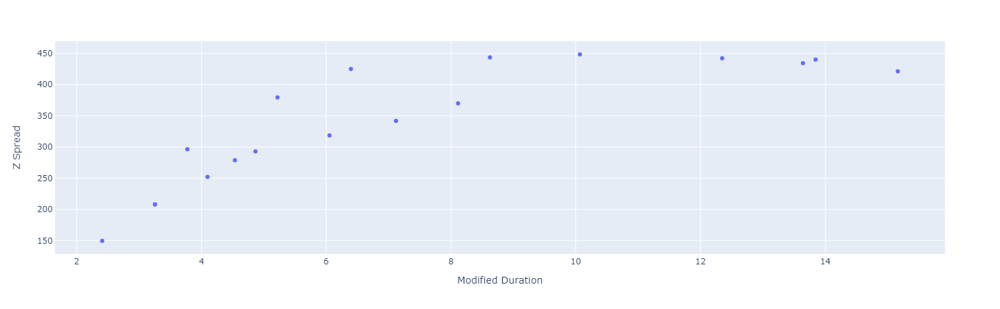

In [6]:
fig = px.scatter(df, x="Modified Duration", y="Z Spread")

fig.show()

### Add a third dimension

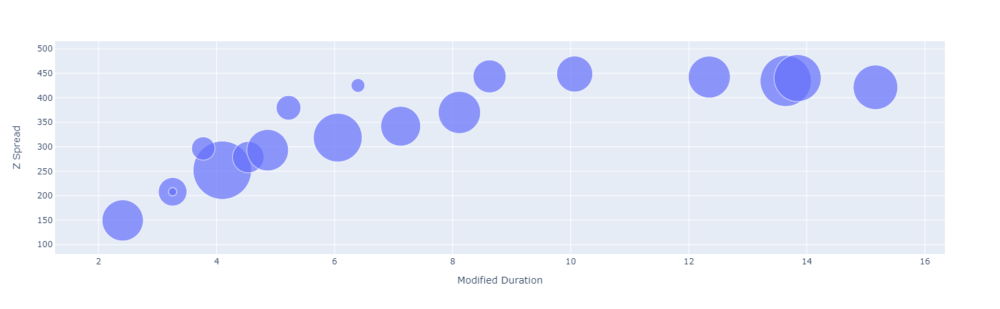

In [7]:
fig = px.scatter(df, x="Modified Duration", y="Z Spread", size='Amount Outstanding',size_max=60)

fig.show()

## Let's plot <i>multiple</i> Y variables - Z Spread vs. Benchmark

### Convert the data to 'long' format for plotly express (Newer versions consume wide-format natively)

In [8]:
#Original dataframe with a column for both 'Z-Spread' and 'Benchmark Spread'
df.head(1)

,Instrument,CF_DATE,Coupon Rate,ISIN,Issuer Rating,Description,First Coupon Date,Issuer Name,Maturity Date,Amount Outstanding,Benchmark Spread,Z Spread,Modified Duration
0,105756BU3=,2020-07-07,2.625,US105756BU30,NaN,BRGV 2.625 01/05/23,2013-01-05,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2023-01-05,2150000000,152.2,149.5,2.409


In [9]:
df_long=pd.melt(df,id_vars=['Description','Instrument','Issuer Name','Maturity Date','Coupon Rate','Modified Duration','Amount Outstanding'], 
                value_vars=['Z Spread','Benchmark Spread'],var_name='Spread',value_name='bps') 
df_long

,Description,Instrument,Issuer Name,Maturity Date,Coupon Rate,Modified Duration,Amount Outstanding,Spread,bps
0,BRGV 2.625 01/05/23,105756BU3=,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2023-01-05,2.625,2.409,2150000000,Z Spread,149.50
1,BRGV 8.875 04/15/24,BR012631375=,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2024-04-15,8.875,3.255,1029030000,Z Spread,207.95
2,BRGV 8.875 04/15/24,BR017244388=,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2024-04-15,8.875,3.255,85557000,Z Spread,207.95
3,BRGV 4.250 01/07/25,105756BV1=,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2025-01-07,4.250,4.097,4300000000,Z Spread,252.00
4,BRGV 8.750 02/04/25,BR021210641=,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2025-02-04,8.750,3.774,688201000,Z Spread,296.42
5,BRGV 2.875 06/06/25,105756CD0=,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2025-06-06,2.875,4.536,1250000000,Z Spread,278.80
6,BRGV 6.000 04/07/26,105756BX7=,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2026-04-07,6.000,4.866,2176245000,Z Spread,292.90
7,BRGV 10.125 05/15/27,105756AE0=,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2027-05-15,10.125,5.219,765023000,Z Spread,379.50
8,BRGV 4.625 01/13/28 '27,105756BZ2=,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2028-01-13,4.625,6.053,3000000000,Z Spread,318.60
9,BRGV 4.500 05/30/29 '29,105756CA6=,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2029-05-30,4.500,7.119,2000000000,Z Spread,341.90


### Plot it

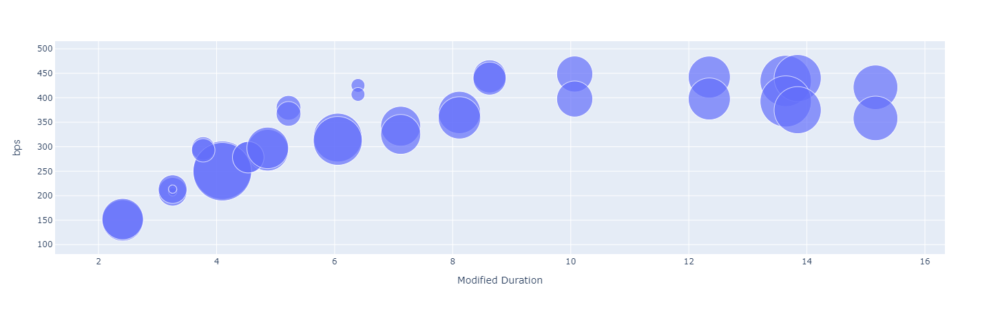

In [10]:
fig = px.scatter(df_long, x='Modified Duration', y='bps', size='Amount Outstanding', size_max=60)

fig.show()

### Enhance it - hover data, colors, themes

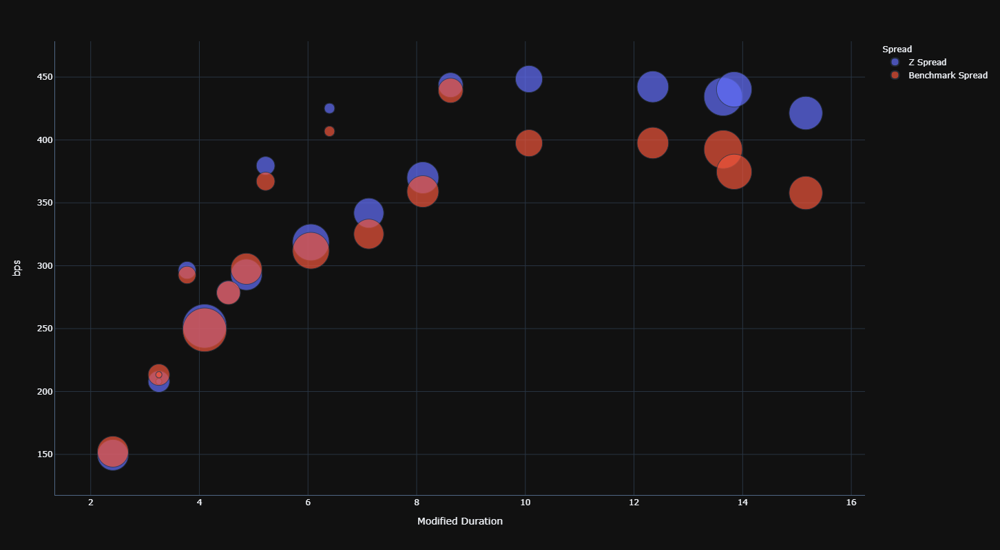

In [11]:
fig = px.scatter(df_long, x='Modified Duration', y='bps',color='Spread',size='Amount Outstanding', size_max=45,   #Change the colors!
                 hover_name='Instrument', hover_data=['Description','Issuer Name','Coupon Rate','Maturity Date','Modified Duration','Amount Outstanding'],
                 height=800,
                 template='plotly_dark') #Dark template - matches codebook nicely!

fig.show()

# <u> Another Dimension... </u>

## How would this data look <i>over time</i>?

### Populate a dataframe with time-series data

In [12]:
#### Set new fields 
ts_fields = ['TR.ZSPREAD','TR.BENCHMARKSPREAD','TR.MODIFIEDDURATION','TR.ZSPREAD.date']  

#Time-series and real-time fields can be different!  Just because you can get a value for something in real-time, doesn't mean you can get it historically.
#The Code Creator (CODECR) app, along with Data Item Browser (DIB) are your friends!
#They help you determine (along with some trial and error), which fields are best suited for your application.

In [13]:
dfts, err = ek.get_data(ricList, ts_fields,
    parameters = {    #Time-series parameters
        'SDate':'0',
        'EDate':'-365 '  #Last 365 days
    }
)

display(dfts)
display(dfts.info())

,Instrument,Z Spread,Benchmark Spread,Modified Duration,Date
0,105756BU3=,149.5,152.2,2.409,2020-07-06T00:00:00Z
1,105756BU3=,152.5,155.3,2.411,2020-07-03T00:00:00Z
2,105756BU3=,154.6,158.0,2.411,2020-07-02T00:00:00Z
3,105756BU3=,160.7,164.2,2.414,2020-07-01T00:00:00Z
4,105756BU3=,161.2,165.4,2.394,2020-06-30T00:00:00Z
...,...,...,...,...,...
4637,105756CB4=,NaN,NaN,NaN,2019-07-12T00:00:00Z
4638,105756CB4=,NaN,NaN,NaN,2019-07-11T00:00:00Z
4639,105756CB4=,NaN,NaN,NaN,2019-07-10T00:00:00Z
4640,105756CB4=,NaN,NaN,NaN,2019-07-09T00:00:00Z


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4642 entries, 0 to 4641
Data columns (total 5 columns):
Instrument           4642 non-null object
Z Spread             4073 non-null float64
Benchmark Spread     4073 non-null float64
Modified Duration    4073 non-null float64
Date                 4642 non-null object
dtypes: float64(3), object(2)
memory usage: 181.5+ KB


None

In [14]:
# Note the last bond doesn't have Spread values...  and it shouldn't have - Dated 2019-11-14!
# Check out the RIC in Eikon - you can see the Dated / First / Last Coupon, and it will even give you the field:  TR.FIFirstCouponDate if you want to bring it in later

### Prepare the data for plotting

In [15]:
dfts.sort_values(by=['Date'],inplace=True)          #Sorts by date for plotting
dfts['Date'] = pd.to_datetime(dfts['Date'])         #Makes it a date field
dfts['Date'] = dfts['Date'].dt.strftime("%Y-%m-%d") #Formats the date
dfts


,Instrument,Z Spread,Benchmark Spread,Modified Duration,Date
4641,105756CB4=,NaN,NaN,NaN,2019-07-08
260,105756BU3=,106.30,104.20,3.306,2019-07-08
513,BR012631375=,109.46,106.23,3.968,2019-07-08
773,BR017244388=,109.85,106.99,3.968,2019-07-08
1033,105756BV1=,145.00,141.70,4.892,2019-07-08
...,...,...,...,...,...
514,BR017244388=,207.95,213.35,3.255,2020-07-06
1814,105756AE0=,379.50,367.10,5.219,2020-07-06
4131,105756BY5=,440.20,374.70,13.844,2020-07-06
3111,BR018426994=,443.69,439.28,8.625,2020-07-06


### Merge the reference data from the first dataframe into my time series dataframe

In [16]:
#First, let's take a look at the original dataframe, and time-series dataframe:
display(df.head(1))
display(dfts.head(1))

,Instrument,CF_DATE,Coupon Rate,ISIN,Issuer Rating,Description,First Coupon Date,Issuer Name,Maturity Date,Amount Outstanding,Benchmark Spread,Z Spread,Modified Duration
0,105756BU3=,2020-07-07,2.625,US105756BU30,NaN,BRGV 2.625 01/05/23,2013-01-05,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2023-01-05,2150000000,152.2,149.5,2.409


,Instrument,Z Spread,Benchmark Spread,Modified Duration,Date
4641,105756CB4=,NaN,NaN,NaN,2019-07-08


#### Rename one of the "Instrument" field names

In [17]:
#To merge/join frames, the key names need to be different, so I'll rename the key 'Instrument' to 'RIC' in the original "df" dataframe
df.rename(columns = {'Instrument':'RIC'}, inplace = True)
display(df.head(1))
display(dfts.head(1))

,RIC,CF_DATE,Coupon Rate,ISIN,Issuer Rating,Description,First Coupon Date,Issuer Name,Maturity Date,Amount Outstanding,Benchmark Spread,Z Spread,Modified Duration
0,105756BU3=,2020-07-07,2.625,US105756BU30,NaN,BRGV 2.625 01/05/23,2013-01-05,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2023-01-05,2150000000,152.2,149.5,2.409


,Instrument,Z Spread,Benchmark Spread,Modified Duration,Date
4641,105756CB4=,NaN,NaN,NaN,2019-07-08


In [18]:
#Create a new, merged, dataframe 
df_merged = dfts.merge(df[['RIC','Coupon Rate','Description','First Coupon Date','Issuer Name','Maturity Date','Amount Outstanding']], left_on='Instrument', right_on='RIC')
df_merged

,Instrument,Z Spread,Benchmark Spread,Modified Duration,Date,RIC,Coupon Rate,Description,First Coupon Date,Issuer Name,Maturity Date,Amount Outstanding
0,105756CB4=,NaN,NaN,NaN,2019-07-08,105756CB4=,4.750,BRGV 4.750 01/14/50 '49,2020-01-14,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2050-01-14,2500000000
1,105756CB4=,NaN,NaN,NaN,2019-07-09,105756CB4=,4.750,BRGV 4.750 01/14/50 '49,2020-01-14,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2050-01-14,2500000000
2,105756CB4=,NaN,NaN,NaN,2019-07-10,105756CB4=,4.750,BRGV 4.750 01/14/50 '49,2020-01-14,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2050-01-14,2500000000
3,105756CB4=,NaN,NaN,NaN,2019-07-11,105756CB4=,4.750,BRGV 4.750 01/14/50 '49,2020-01-14,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2050-01-14,2500000000
4,105756CB4=,NaN,NaN,NaN,2019-07-12,105756CB4=,4.750,BRGV 4.750 01/14/50 '49,2020-01-14,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2050-01-14,2500000000
...,...,...,...,...,...,...,...,...,...,...,...,...
4637,105756BY5=,459.0,393.6,13.724,2020-06-30,105756BY5=,5.625,BRGV 5.625 02/21/47,2017-02-21,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2047-02-21,2789332000
4638,105756BY5=,454.4,389.4,13.733,2020-07-01,105756BY5=,5.625,BRGV 5.625 02/21/47,2017-02-21,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2047-02-21,2789332000
4639,105756BY5=,445.2,379.7,13.816,2020-07-02,105756BY5=,5.625,BRGV 5.625 02/21/47,2017-02-21,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2047-02-21,2789332000
4640,105756BY5=,476.3,380.0,13.820,2020-07-03,105756BY5=,5.625,BRGV 5.625 02/21/47,2017-02-21,"BRAZIL, FEDERATIVE REPUBLIC OF (GOVERNMENT)",2047-02-21,2789332000


### Convert the data to 'long' format

In [19]:
df_long_ts=pd.melt(df_merged,id_vars=['Date','Instrument','Description','Maturity Date','Coupon Rate','Modified Duration','Amount Outstanding'],
                   value_vars=['Z Spread','Benchmark Spread'],var_name='Spread',value_name='bps') 
df_long_ts.sort_values(by=['Date'],inplace=True) #Resort by date (for plotting reasons)


### Build the scatter plot using 'Date' for the slider

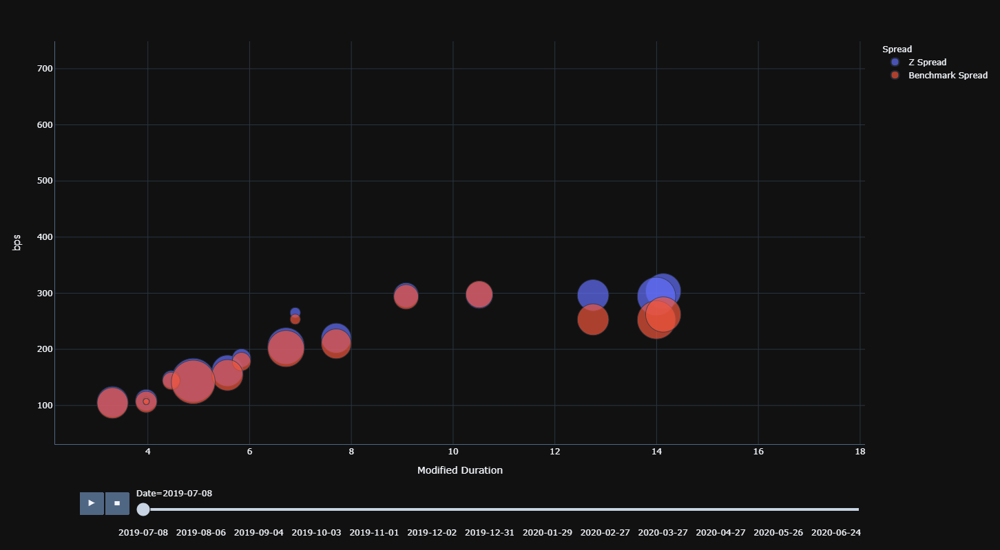

In [20]:
fig = px.scatter(df_long_ts, x='Modified Duration', y='bps', animation_frame='Date', animation_group='Instrument',
                 size='Amount Outstanding', size_max=45, color="Spread", template='plotly_dark',
                 hover_name='Instrument',
                 hover_data=['Description','Coupon Rate','Modified Duration','Amount Outstanding','Spread','bps'],
                 #Adjusting the x and y ranges....
                 range_x=[df_long_ts['Modified Duration'].min()/1.1, df_long_ts['Modified Duration'].max()*1.1],  
                 range_y=[df_long_ts['bps'].min()/1.2, df_long_ts['bps'].max()*1.2],
                 height=800
                )

#fig["layout"].pop("updatemenus") # optional, drop animation buttons
fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 40 # changes the frame rate to 50 milliseconds
fig.show()

In [21]:
###################################

# Curve Spread Example
### Four different spreads, over time - Z Spread, Government Spread, Asset Spread & Asset Swap Spread
### Petroleos Mexicanos USD Global Agency Curve

## <u> Gather data </u>

#### Get RICs from the Chain RIC - you can always put these in manually

In [22]:
df, err = ek.get_data(
    instruments = ['0#PEMEXUSDGBMK='],
    fields = ['CF_NAME','GV4_TEXT']
)

display(df)

,Instrument,CF_NAME,GV4_TEXT
0,ISSUE/METHOD,,None
1,PEMEXUSDGBMK,None,None
2,PEMEXUSDG1Y=,PEMEX USD G1Y,1Y
3,PEMEXUSDG2Y=,PEMEX USD G2Y,2Y
4,PEMEXUSDG3Y=,PEMEX USD G3Y,3Y
5,PEMEXUSDG4Y=,PEMEX USD G4Y,4Y
6,PEMEXUSDG5Y=,PEMEX USD G5Y,5Y
7,PEMEXUSDG6Y=,PEMEX USD G6Y,6Y
8,PEMEXUSDG7Y=,PEMEX USD G7Y,7Y
9,PEMEXUSDG8Y=,PEMEX USD G8Y,8Y


####  Set my RICs

In [23]:
pem_rics = df['Instrument'][2:17]
pem_rics = [''.join(elemnt) for elemnt in pem_rics]  #Eikon formula wants a list!
display(pem_rics)
display(type(pem_rics))

['PEMEXUSDG1Y=',
 'PEMEXUSDG2Y=',
 'PEMEXUSDG3Y=',
 'PEMEXUSDG4Y=',
 'PEMEXUSDG5Y=',
 'PEMEXUSDG6Y=',
 'PEMEXUSDG7Y=',
 'PEMEXUSDG8Y=',
 'PEMEXUSDG9Y=',
 'PEMEXUSDG10Y=',
 'PEMEXUSDG12Y=',
 'PEMEXUSDG15Y=',
 'PEMEXUSDG20Y=',
 'PEMEXUSDG25Y=',
 'PEMEXUSDG30Y=']

list

#### Set my fields

In [24]:
fields = ['CF_NAME','GV4_TEXT']
          #'TR.BENCHMARKSPREAD','TR.ZSPREAD','TR.SWAPSPREAD','TR.ASSETSWAPSPREAD']

### Get RIC reference data

In [25]:
pem_df, err = ek.get_data(pem_rics, fields)

pem_df.rename(columns={'GV4_TEXT':'Tenor','CF_NAME':'Name'},inplace=True)  # Rename the columns

pem_df

,Instrument,Name,Tenor
0,PEMEXUSDG1Y=,PEMEX USD G1Y,1Y
1,PEMEXUSDG2Y=,PEMEX USD G2Y,2Y
2,PEMEXUSDG3Y=,PEMEX USD G3Y,3Y
3,PEMEXUSDG4Y=,PEMEX USD G4Y,4Y
4,PEMEXUSDG5Y=,PEMEX USD G5Y,5Y
5,PEMEXUSDG6Y=,PEMEX USD G6Y,6Y
6,PEMEXUSDG7Y=,PEMEX USD G7Y,7Y
7,PEMEXUSDG8Y=,PEMEX USD G8Y,8Y
8,PEMEXUSDG9Y=,PEMEX USD G9Y,9Y
9,PEMEXUSDG10Y=,PEMEX USD G10Y,10Y


### Get Time Series data

In [26]:
ts_fields = ['TR.BENCHMARKSPREAD.date','TR.BENCHMARKSPREAD','TR.ZSPREAD','TR.SWAPSPREAD','TR.ASSETSWAPSPREAD']

In [27]:
pem_ts, err = ek.get_data(pem_rics, ts_fields,
    parameters = {    #Time-series parameters
        'SDate':'0',
        'EDate':'-365 '  #Last 365 days
    }
)

pem_ts

,Instrument,Date,Benchmark Spread,Z Spread,Swap Spread,Asset Swap Spread
0,PEMEXUSDG1Y=,2020-07-06T00:00:00Z,435.8,439.7,425.7,419.3
1,PEMEXUSDG1Y=,2020-07-03T00:00:00Z,433.3,436.4,422.1,416.3
2,PEMEXUSDG1Y=,2020-07-02T00:00:00Z,434.0,436.7,422.5,416.5
3,PEMEXUSDG1Y=,2020-07-01T00:00:00Z,431.6,434.6,420.3,414.6
4,PEMEXUSDG1Y=,2020-06-30T00:00:00Z,446.3,450.1,435.6,429.1
...,...,...,...,...,...,...
3910,PEMEXUSDG30Y=,2019-07-12T00:00:00Z,511.3,588.1,546.8,531.3
3911,PEMEXUSDG30Y=,2019-07-11T00:00:00Z,522.9,598.4,557.2,541.1
3912,PEMEXUSDG30Y=,2019-07-10T00:00:00Z,523.4,598.9,557.6,541.7
3913,PEMEXUSDG30Y=,2019-07-09T00:00:00Z,509.3,581.8,542.9,527.5


## Merge the reference data from the first dataframe into my time series dataframe

In [28]:
pem_df.rename(columns = {'Instrument':'RIC'}, inplace = True)  #Must rename to merge!

In [29]:
pem_merged = pem_ts.merge(pem_df[['RIC','Name','Tenor']], left_on='Instrument', right_on='RIC')
pem_merged

,Instrument,Date,Benchmark Spread,Z Spread,Swap Spread,Asset Swap Spread,RIC,Name,Tenor
0,PEMEXUSDG1Y=,2020-07-06T00:00:00Z,435.8,439.7,425.7,419.3,PEMEXUSDG1Y=,PEMEX USD G1Y,1Y
1,PEMEXUSDG1Y=,2020-07-03T00:00:00Z,433.3,436.4,422.1,416.3,PEMEXUSDG1Y=,PEMEX USD G1Y,1Y
2,PEMEXUSDG1Y=,2020-07-02T00:00:00Z,434.0,436.7,422.5,416.5,PEMEXUSDG1Y=,PEMEX USD G1Y,1Y
3,PEMEXUSDG1Y=,2020-07-01T00:00:00Z,431.6,434.6,420.3,414.6,PEMEXUSDG1Y=,PEMEX USD G1Y,1Y
4,PEMEXUSDG1Y=,2020-06-30T00:00:00Z,446.3,450.1,435.6,429.1,PEMEXUSDG1Y=,PEMEX USD G1Y,1Y
...,...,...,...,...,...,...,...,...,...
3910,PEMEXUSDG30Y=,2019-07-12T00:00:00Z,511.3,588.1,546.8,531.3,PEMEXUSDG30Y=,PEMEX USD G30Y,30Y
3911,PEMEXUSDG30Y=,2019-07-11T00:00:00Z,522.9,598.4,557.2,541.1,PEMEXUSDG30Y=,PEMEX USD G30Y,30Y
3912,PEMEXUSDG30Y=,2019-07-10T00:00:00Z,523.4,598.9,557.6,541.7,PEMEXUSDG30Y=,PEMEX USD G30Y,30Y
3913,PEMEXUSDG30Y=,2019-07-09T00:00:00Z,509.3,581.8,542.9,527.5,PEMEXUSDG30Y=,PEMEX USD G30Y,30Y


### Prepare the data for plotting

In [30]:
#  Create a new column with the Tenor years in Integer form so I can sort them for plotting purposes
pem_merged['TenorYears'] = pem_merged['Tenor'].str.replace(r'\D+', '').astype(int)  #Strips field to just an integer

#  Sort based on TenorYears and Date fields
pem_merged.sort_values(by=['TenorYears','Date'],inplace=True)
pem_merged

#  Human Readable Dates
pem_merged['Date'] = pd.to_datetime(pem_merged['Date'])         #Makes it a date field
pem_merged['Date'] = pem_merged['Date'].dt.strftime("%Y-%m-%d") #Formats the date to something more readable

### Convert to 'Long' format for plotting

In [31]:
pem_merged_long=pd.melt(pem_merged,id_vars=['Date','Instrument','Name','Tenor','TenorYears'],
                   value_vars=['Z Spread','Benchmark Spread','Swap Spread', 'Asset Swap Spread'],var_name='Spread',value_name='bps') 
pem_merged_long

,Date,Instrument,Name,Tenor,TenorYears,Spread,bps
0,2019-07-08,PEMEXUSDG1Y=,PEMEX USD G1Y,1Y,1,Z Spread,196.4
1,2019-07-09,PEMEXUSDG1Y=,PEMEX USD G1Y,1Y,1,Z Spread,206.8
2,2019-07-10,PEMEXUSDG1Y=,PEMEX USD G1Y,1Y,1,Z Spread,220.8
3,2019-07-11,PEMEXUSDG1Y=,PEMEX USD G1Y,1Y,1,Z Spread,211.7
4,2019-07-12,PEMEXUSDG1Y=,PEMEX USD G1Y,1Y,1,Z Spread,203.4
...,...,...,...,...,...,...,...
15655,2020-06-30,PEMEXUSDG30Y=,PEMEX USD G30Y,30Y,30,Asset Swap Spread,803.1
15656,2020-07-01,PEMEXUSDG30Y=,PEMEX USD G30Y,30Y,30,Asset Swap Spread,781.1
15657,2020-07-02,PEMEXUSDG30Y=,PEMEX USD G30Y,30Y,30,Asset Swap Spread,770.7
15658,2020-07-03,PEMEXUSDG30Y=,PEMEX USD G30Y,30Y,30,Asset Swap Spread,777.6


## Plot the data

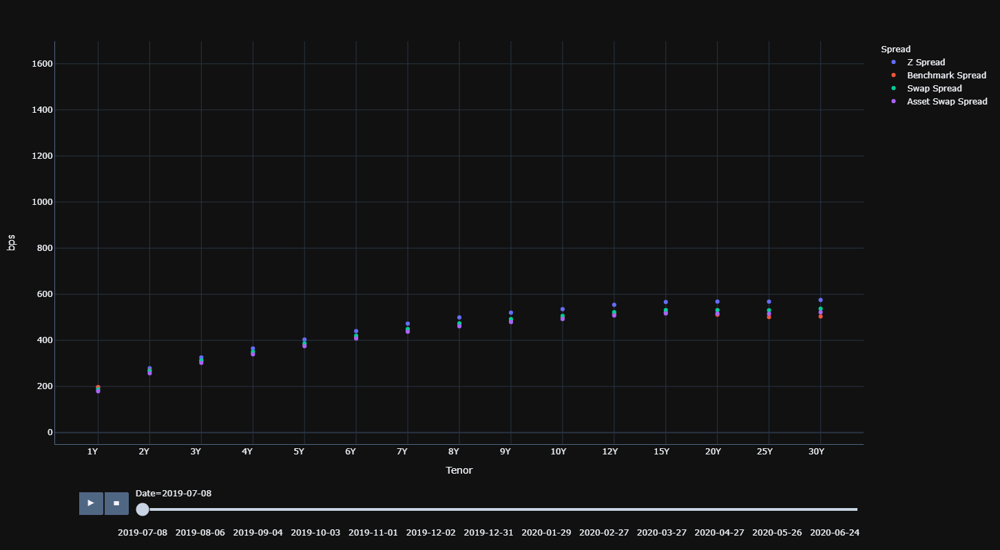

In [32]:
 fig = px.scatter(pem_merged_long, x='Tenor', y='bps', animation_frame='Date', animation_group='Instrument',
                 color="Spread", template='plotly_dark',
                 hover_name='Name',
                 hover_data=['Spread','bps','Tenor'],
                 range_y=[-50, pem_merged_long['bps'].max()*1.05],  #Adjusting the x and y ranges....
                 height=800
               )

#fig["layout"].pop("updatemenus") # optional, drop animation buttons
fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 40 # changes the frame rate in milliseconds
fig.show()